In [130]:
import pandas as pd
import numpy as np

### Importing the data

In [131]:
df=pd.read_csv('MarketPricePrediction.csv')

In [132]:
df

,market,month,year,quantity,priceMin,priceMax,priceMod,state,city,date
0,ABOHAR(PB),January,2005,2350,404,493,446,PB,ABOHAR,January-2005
1,ABOHAR(PB),January,2006,900,487,638,563,PB,ABOHAR,January-2006
2,ABOHAR(PB),January,2010,790,1283,1592,1460,PB,ABOHAR,January-2010
3,ABOHAR(PB),January,2011,245,3067,3750,3433,PB,ABOHAR,January-2011
4,ABOHAR(PB),January,2012,1035,523,686,605,PB,ABOHAR,January-2012
5,ABOHAR(PB),January,2013,675,1327,1900,1605,PB,ABOHAR,January-2013
6,ABOHAR(PB),January,2014,440,1025,1481,1256,PB,ABOHAR,January-2014
7,ABOHAR(PB),January,2015,1305,1309,1858,1613,PB,ABOHAR,January-2015
8,ABOHAR(PB),February,2005,1400,286,365,324,PB,ABOHAR,February-2005
9,ABOHAR(PB),February,2006,1800,343,411,380,PB,ABOHAR,February-2006


In [133]:
df.shape

(10227, 10)

In [134]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10227 entries, 0 to 10226
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   market    10227 non-null  object
 1   month     10227 non-null  object
 2   year      10227 non-null  int64 
 3   quantity  10227 non-null  int64 
 4   priceMin  10227 non-null  int64 
 5   priceMax  10227 non-null  int64 
 6   priceMod  10227 non-null  int64 
 7   state     10227 non-null  object
 8   city      10227 non-null  object
 9   date      10227 non-null  object
dtypes: int64(5), object(5)
memory usage: 799.1+ KB


In [37]:
df.describe()






,year,quantity,priceMin,priceMax,priceMod
count,10227.000000,1.022700e+04,10227.000000,10227.000000,10227.000000
mean,2009.022294,7.660488e+04,646.944363,1212.760731,984.284345
std,4.372841,1.244087e+05,673.121850,979.658874,818.471498
min,1996.000000,2.000000e+01,16.000000,145.000000,80.000000
25%,2006.000000,8.898000e+03,209.000000,557.000000,448.000000
50%,2009.000000,2.746000e+04,440.000000,923.000000,747.000000
75%,2013.000000,8.835650e+04,828.000000,1527.000000,1248.000000
max,2016.000000,1.639032e+06,6000.000000,8192.000000,6400.000000


## checks for null values

In [135]:

df.isna()

,market,month,year,quantity,priceMin,priceMax,priceMod,state,city,date
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False


In [136]:
df.isna().sum()

market      0
month       0
year        0
quantity    0
priceMin    0
priceMax    0
priceMod    0
state       0
city        0
date        0
dtype: int64

### Importing Time series models

In [137]:
#importing SARIMAX
from statsmodels.tsa.statespace.sarimax import SARIMAX

#importing PROPHET
from prophet import Prophet

import torch
import torch.nn as nn

#Importing LSTM
import tensorflow.compat.v1 as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

#importing ARIMA & its other needed libraries
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA

### Preprocessing

In [138]:


import tensorflow.compat.v1 as tf

In [139]:
from sklearn import preprocessing 
label_encoder = preprocessing.LabelEncoder()

### Encoding Categorical data into Numerical

In [140]:
df["market"] = label_encoder.fit_transform(df["market"])
df["month"] = label_encoder.fit_transform(df["month"])
df["state"] = label_encoder.fit_transform(df["state"])
df["city"] = label_encoder.fit_transform(df["city"])

In [141]:
df.head()

,market,month,year,quantity,priceMin,priceMax,priceMod,state,city,date
0,0,4,2005,2350,404,493,446,16,0,January-2005
1,0,4,2006,900,487,638,563,16,0,January-2006
2,0,4,2010,790,1283,1592,1460,16,0,January-2010
3,0,4,2011,245,3067,3750,3433,16,0,January-2011
4,0,4,2012,1035,523,686,605,16,0,January-2012


### Feature Engineering

In [142]:
from datetime import datetime

# Example date strings
date_strings = []

# Parse dates into datetime objects
parsed_dates = [datetime.strptime(date_str, '%B-%Y') for date_str in date_strings]

# Print the parsed dates
for date in parsed_dates:
    print(date)

In [143]:
df.head()

,market,month,year,quantity,priceMin,priceMax,priceMod,state,city,date
0,0,4,2005,2350,404,493,446,16,0,January-2005
1,0,4,2006,900,487,638,563,16,0,January-2006
2,0,4,2010,790,1283,1592,1460,16,0,January-2010
3,0,4,2011,245,3067,3750,3433,16,0,January-2011
4,0,4,2012,1035,523,686,605,16,0,January-2012


In [144]:
df['date'] = pd.to_datetime(df['date'])

C:\Users\ADDIS\AppData\Local\Temp\ipykernel_14340\3532345252.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['date'] = pd.to_datetime(df['date'])


In [145]:
df.head()

,market,month,year,quantity,priceMin,priceMax,priceMod,state,city,date
0,0,4,2005,2350,404,493,446,16,0,2005-01-01
1,0,4,2006,900,487,638,563,16,0,2006-01-01
2,0,4,2010,790,1283,1592,1460,16,0,2010-01-01
3,0,4,2011,245,3067,3750,3433,16,0,2011-01-01
4,0,4,2012,1035,523,686,605,16,0,2012-01-01


### importing Visualization Libs

In [146]:
import matplotlib.pyplot as plt

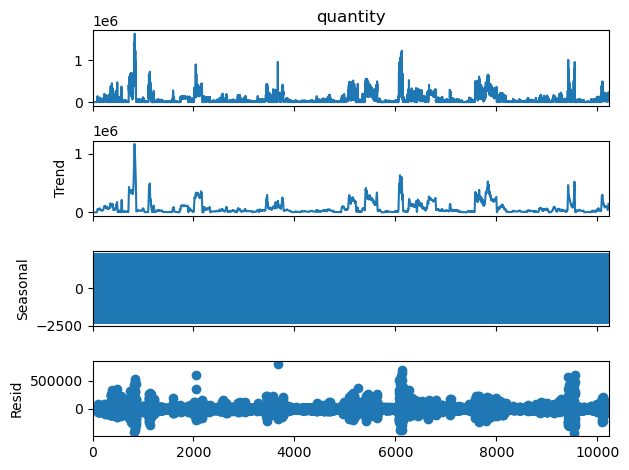

In [147]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series
result = seasonal_decompose(df['quantity'], model='additive', period=12)

# Plot the decomposed components
result.plot()
plt.show()

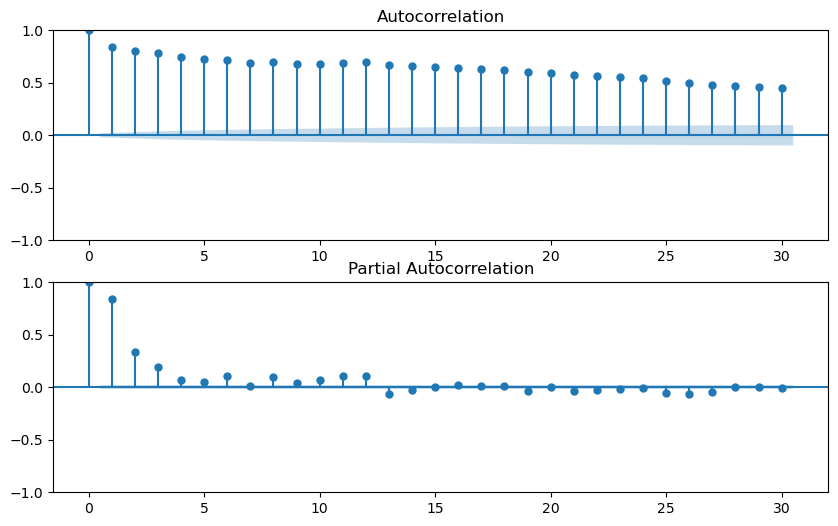

In [148]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF
fig, axes = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(df['quantity'], lags=30, ax=axes[0])
plot_pacf(df['quantity'], lags=30, ax=axes[1])
plt.show()




In [149]:
from statsmodels.tsa.stattools import adfuller

# Perform Augmented Dickey-Fuller test for stationarity
result = adfuller(df['quantity'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -8.568349524394943
p-value: 8.3274552753651e-14


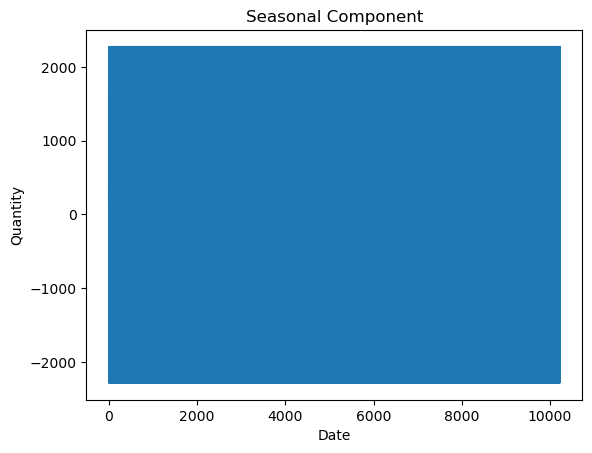

In [150]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series
result = seasonal_decompose(df['quantity'], model='additive', period=12)

# Plot the seasonal component
seasonal_component = result.seasonal
seasonal_component.plot()
plt.title('Seasonal Component')
plt.xlabel('Date')
plt.ylabel('Quantity')
plt.show()

In [151]:
df['date'] = pd.to_datetime(df['date'])

# Set the splitting points
train_start_date = pd.to_datetime('2005-01-01')  # January 2005
train_end_date = pd.to_datetime('2013-12-31')    # December 2013
test_start_date = pd.to_datetime('2014-01-01')   # January 2014
test_end_date = pd.to_datetime('2015-12-31')     # December 2015

# Split the data into training and testing sets
train_data = df[(df['date'] >= train_start_date) & (df['date'] <= train_end_date)]
test_data = df[(df['date'] >= test_start_date) & (df['date'] <= test_end_date)]

In [152]:
# Assuming train_data and test_data are valid time series data
print("Train data index:", train_data.index[:5])
print("Test data index:", test_data.index[:5])

# Check if the indices align correctly
# If not, ensure that the data is correctly loaded and indexed


Train data index: Index([0, 1, 2, 3, 4], dtype='int64')
Test data index: Index([6, 7, 14, 15, 22], dtype='int64')


In [153]:
# Assuming 'date' is the column containing date strings
df['date'] = pd.to_datetime(df['date'], format='%b-%y')

# Assuming you want to filter the data to include only dates from January 2005 to December 2015
start_date = pd.to_datetime('2005-01-01')
end_date = pd.to_datetime('2015-12-31')

# Filter the DataFrame to include only dates within the specified range
df_filtered = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

In [154]:
import pandas as pd

# Assuming 'date' is the column containing date strings
df['date'] = pd.to_datetime(df['date'], format='%b-%y')

# Assuming you want to filter the data to include only dates from January 2005 to December 2015
start_date = pd.to_datetime('2005-01-01')
end_date = pd.to_datetime('2015-12-31')

# Filter the DataFrame to include only dates within the specified range
df_filtered = df[(df['date'] >= start_date) & (df['date'] <= end_date)]


In [155]:
df.head()

,market,month,year,quantity,priceMin,priceMax,priceMod,state,city,date
0,0,4,2005,2350,404,493,446,16,0,2005-01-01
1,0,4,2006,900,487,638,563,16,0,2006-01-01
2,0,4,2010,790,1283,1592,1460,16,0,2010-01-01
3,0,4,2011,245,3067,3750,3433,16,0,2011-01-01
4,0,4,2012,1035,523,686,605,16,0,2012-01-01


In [156]:
df.plot((figsize=(10, 6)))

SyntaxError: invalid syntax. Maybe you meant '==' or ':=' instead of '='? (464325623.py, line 1)

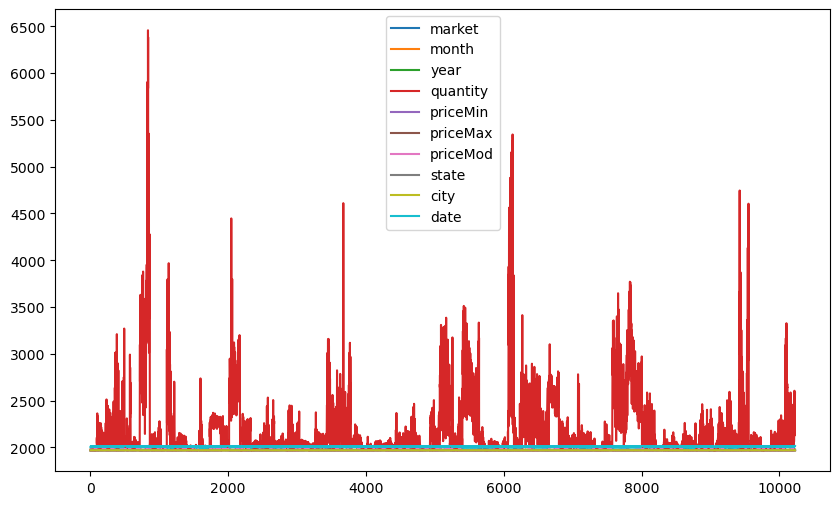

In [157]:
df.plot(figsize=(10, 6))  # Width: 10 inches, Height: 6 inches

# Display the plot
plt.show()

In [158]:
df['date'] = pd.to_datetime(df['date'])

# Set 'date_column' as the index of the DataFrame
df.set_index('date', inplace=True)


In [159]:
df.head()

,market,month,year,quantity,priceMin,priceMax,priceMod,state,city
date,,,,,,,,,
2005-01-01,0,4,2005,2350,404,493,446,16,0
2006-01-01,0,4,2006,900,487,638,563,16,0
2010-01-01,0,4,2010,790,1283,1592,1460,16,0
2011-01-01,0,4,2011,245,3067,3750,3433,16,0
2012-01-01,0,4,2012,1035,523,686,605,16,0


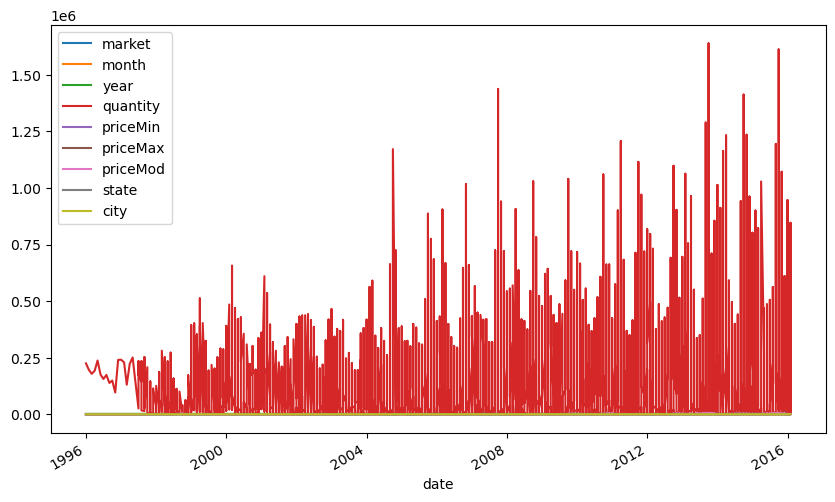

In [160]:
df.plot(figsize=(10, 6))

# Display the plot
plt.show()

In [161]:
#market	month	year	quantity	priceMin	priceMax	priceMod	state	city

<Axes: xlabel='date'>

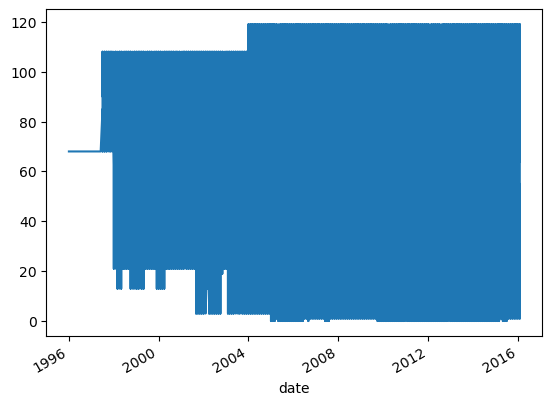

In [162]:
df['market'].plot()


In [163]:
pd.set_option('display.max_rows', None)


# Print specific columns
print(df[['market', 'month', 'year', 'quantity', 'priceMin', 'priceMax', 'priceMod', 'state', 'city']])


            market  month  year  quantity  priceMin  priceMax  priceMod  \
date                                                                      
2005-01-01       0      4  2005      2350       404       493       446   
2006-01-01       0      4  2006       900       487       638       563   
2010-01-01       0      4  2010       790      1283      1592      1460   
2011-01-01       0      4  2011       245      3067      3750      3433   
2012-01-01       0      4  2012      1035       523       686       605   
2013-01-01       0      4  2013       675      1327      1900      1605   
2014-01-01       0      4  2014       440      1025      1481      1256   
2015-01-01       0      4  2015      1305      1309      1858      1613   
2005-02-01       0      3  2005      1400       286       365       324   
2006-02-01       0      3  2006      1800       343       411       380   
2010-02-01       0      3  2010       555      1143      1460      1322   
2011-02-01       0      3

<Axes: xlabel='date'>

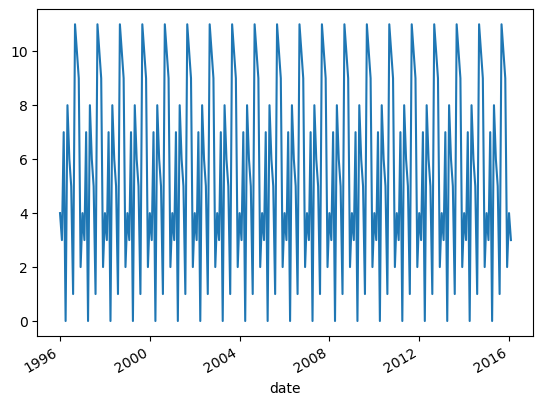

In [164]:
df['month'].plot()

<Axes: xlabel='date'>

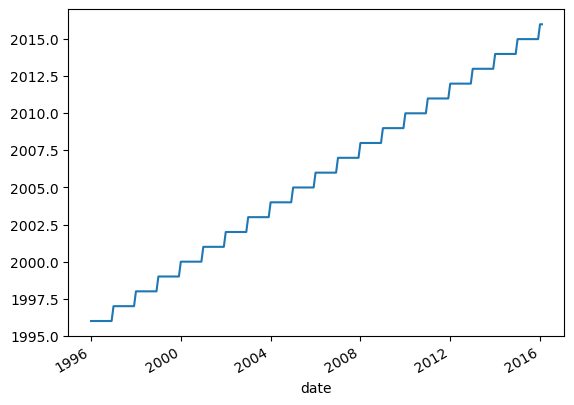

In [165]:
df['year'].plot()

<Axes: xlabel='date'>

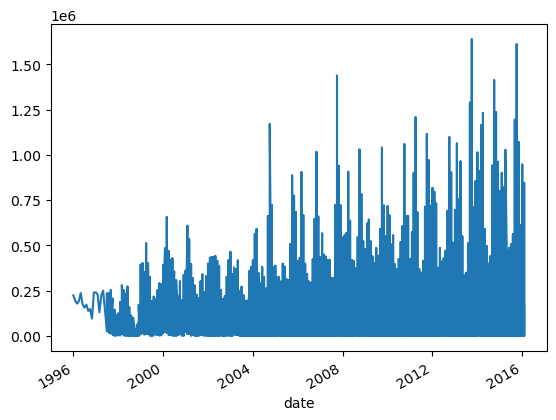

In [166]:
df['quantity'].plot()

<Axes: xlabel='date'>

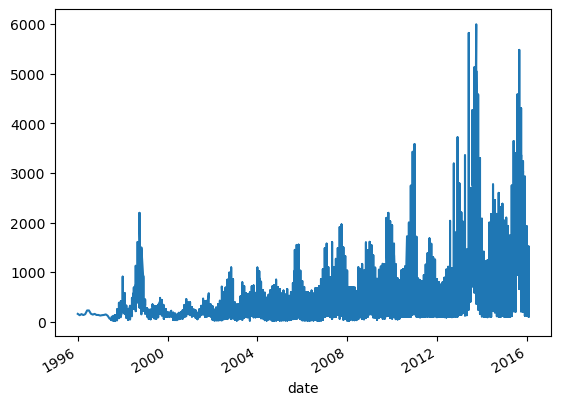

In [167]:
df['priceMin'].plot()

<Axes: xlabel='date'>

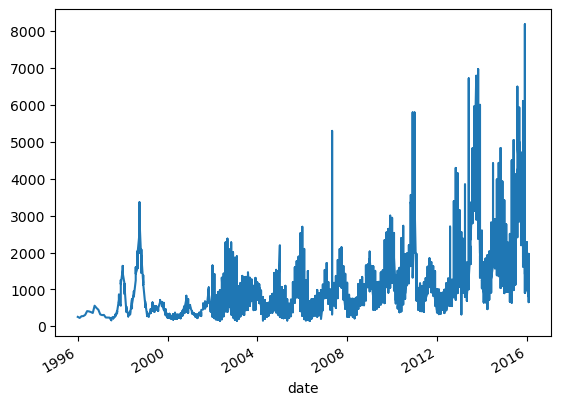

In [168]:
df['priceMax'].plot()

<Axes: xlabel='date'>

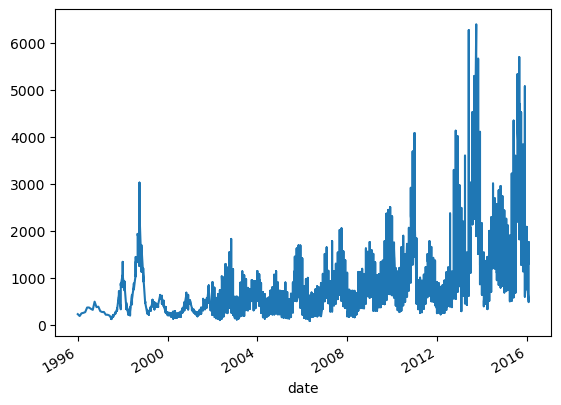

In [169]:
df['priceMod'].plot()

<Axes: xlabel='date'>

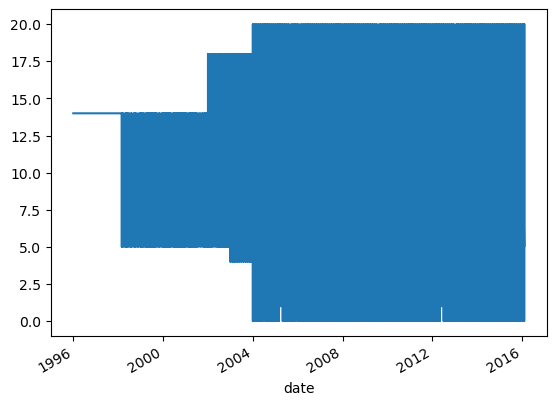

In [170]:
df['state'].plot()

<Axes: xlabel='date'>

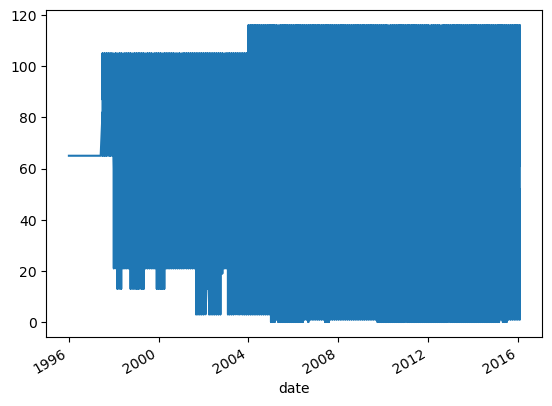

In [171]:
df['city'].plot()

In [172]:
df['100ma'] =df['priceMod'].rolling(window=100).mean()

In [173]:
print(df.tail())

            market  month  year  quantity  priceMin  priceMax  priceMod  \
date                                                                      
2011-12-01     119      2  2011    131326       282       612       526   
2012-12-01     119      2  2012    207066       485      1327      1136   
2013-12-01     119      2  2013    215883       472      1427      1177   
2014-12-01     119      2  2014    201077       446      1654      1456   
2015-12-01     119      2  2015    223315       609      1446      1126   

            state  city    100ma  
date                              
2011-12-01     14   116   980.76  
2012-12-01     14   116   989.52  
2013-12-01     14   116   996.80  
2014-12-01     14   116  1006.74  
2015-12-01     14   116  1014.71  


In [174]:
df.dropna(inplace=True)
print(df.head())

            market  month  year  quantity  priceMin  priceMax  priceMod  \
date                                                                      
2014-01-01       1      4  2014    143920      1102      1246      1200   
2015-01-01       1      4  2015     64990      1587      1746      1693   
2016-01-01       1      4  2016    134200      1039      1443      1349   
2005-02-01       1      3  2005      4800       300       390       345   
2006-02-01       1      3  2006     13400       354       453       412   

            state  city    100ma  
date                              
2014-01-01     19     1  1168.15  
2015-01-01     19     1  1180.62  
2016-01-01     19     1  1188.48  
2005-02-01     19     1  1177.33  
2006-02-01     19     1  1147.12  


<Axes: xlabel='date'>

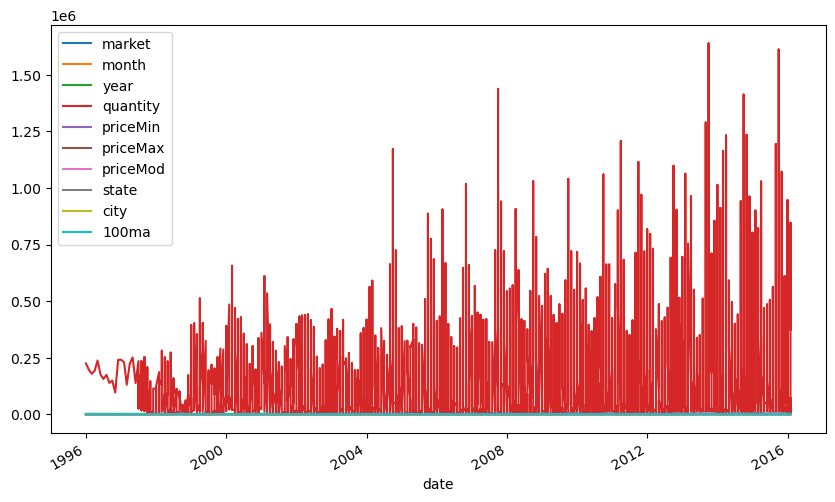

In [175]:
df.plot(figsize=(10, 6))

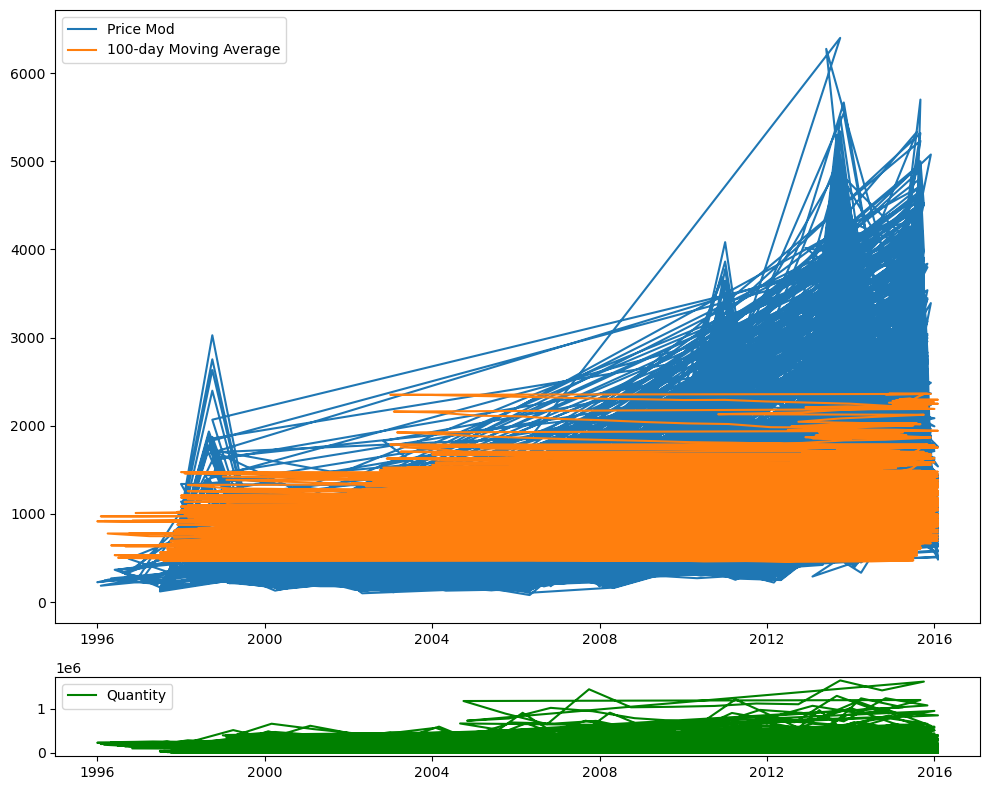

In [176]:
import matplotlib.pyplot as plt

# Create subplots with gridspec
fig = plt.figure(figsize=(10, 8))
ax1 = plt.subplot2grid((6,1), (0,0), rowspan=5, colspan=1)
ax2 = plt.subplot2grid((6,1), (5,0), rowspan=1, colspan=1)

# Plot 'priceMod' and its 100-period moving average on ax1
ax1.plot(df.index, df['priceMod'], label='Price Mod')
ax1.plot(df.index, df['100ma'], label='100-day Moving Average')
ax1.legend()

# Plot 'quantity' on ax2
ax2.plot(df.index, df['quantity'], label='Quantity', color='green')
ax2.legend()

# Show the plot
plt.tight_layout()
plt.show()


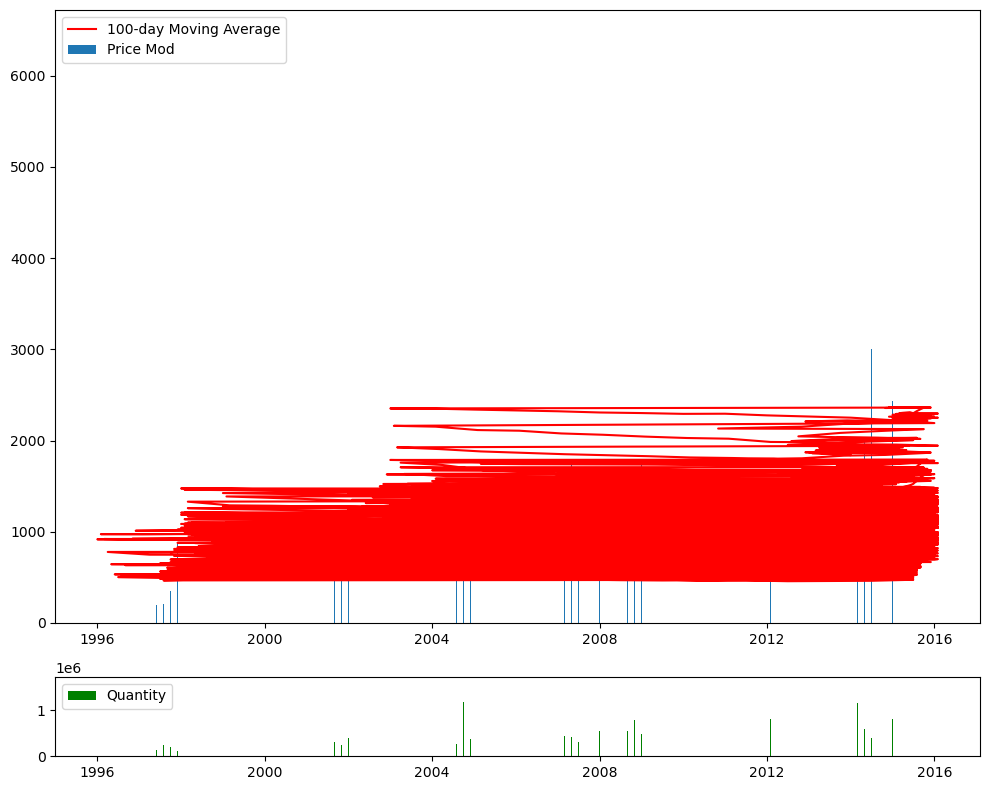

In [177]:
# Create subplots with gridspec
fig = plt.figure(figsize=(10, 8))
ax1 = plt.subplot2grid((6,1), (0,0), rowspan=5, colspan=1)
ax2 = plt.subplot2grid((6,1), (5,0), rowspan=1, colspan=1)

# Plot 'priceMod' and its 100-period moving average on ax1 as bars
ax1.bar(df.index, df['priceMod'], label='Price Mod')
ax1.plot(df.index, df['100ma'], label='100-day Moving Average', color='red')  # Plot the moving average as a line
ax1.legend()

# Plot 'quantity' on ax2 as bars
ax2.bar(df.index, df['quantity'], label='Quantity', color='green')
ax2.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [129]:
dfreg=df.loc[:,['priceMod', 'quantity']]
dfreg['MinMax_%'] = (df['priceMax'] -df['priceMin']) / df['priceMod'] *100
dfreg.head()

,priceMod,quantity,MinMax_%
date,,,


In [126]:

from sklearn import preprocessing

In [104]:
from sklearn.metrics import mean_squared_error

In [179]:
train_size = int(len(df['priceMod']) * 0.8)
train,test =df['priceMod'][:train_size], df['priceMod'][train_size]

model= ARIMA(train, order =(2,0,2))
model_fit = model.fit()

predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1)

rmse = sqrt(mean_squared_error(test, predictions))
rmse

C:\Users\ADDIS\AppData\Local\Temp\ipykernel_14340\1242952360.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  train,test =df['priceMod'][:train_size], df['priceMod'][train_size]


NotImplementedError: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been removed in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and statsmodels.tsa.SARIMAX.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained. It also offers alternative specialized
parameter estimators.


In [180]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Assuming df is your DataFrame with time series data
# Assuming the data is already prepared and in a suitable format

# Split data into training and testing sets
train_size = int(len(df['priceMod']) * 0.8)
train, test = df['priceMod'][:train_size], df['priceMod'][train_size:]

# Fit ARIMA model
model = ARIMA(train, order=(2, 0, 2))
model_fit = model.fit()

# Make predictions
predictions = model_fit.forecast(steps=len(test))

# Calculate RMSE
rmse = sqrt(mean_squared_error(test, predictions))
print('Root Mean Squared Error (RMSE):', rmse)


C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-

Root Mean Squared Error (RMSE): 773.5390878844426


C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [181]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy as np

# Assuming df is your DataFrame with time series data
# Assuming the data is already prepared and in a suitable format

# Split data into training and testing sets
train_size = int(len(df) * 0.8)  # 80% training data
train_data, test_data = df.iloc[:train_size], df.iloc[train_size:]

# Define values for p, d, and q
p = 1  # Placeholder, replace with appropriate value
d = 1  # Placeholder, replace with appropriate value
q = 1  # Placeholder, replace with appropriate value

# Fit ARIMA model
model = ARIMA(train_data['priceMod'], order=(p, d, q))  # Specify appropriate values for p, d, q
model_fit = model.fit()

# Forecast
forecast = model_fit.forecast(steps=len(test_data))  # Forecast for the length of the test set

# Evaluate the model
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(test_data['priceMod'], forecast)
print('Mean Squared Error (MSE):', mse)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print('Root Mean Squared Error (RMSE):', rmse)


C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADDIS\anaconda3\Lib\site-

Mean Squared Error (MSE): 862617.5569344009
Root Mean Squared Error (RMSE): 928.772069419834


C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [182]:
# Assuming you have already fitted your ARIMA model and named it model_fit

# Define the number of steps ahead you want to forecast
num_steps = len(test_data)  # Assuming you want to forecast for the length of your test data

# Make predictions
predictions = model_fit.predict(start=len(train_data), end=len(train_data)+num_steps-1, typ='levels')

# Now predictions will contain the forecasted values
print(predictions)


8102     1756.412065
8103     1491.825354
8104     1448.278046
8105     1441.110762
8106     1439.931126
8107     1439.736975
8108     1439.705020
8109     1439.699761
8110     1439.698895
8111     1439.698753
8112     1439.698729
8113     1439.698725
8114     1439.698725
8115     1439.698725
8116     1439.698725
8117     1439.698725
8118     1439.698725
8119     1439.698725
8120     1439.698725
8121     1439.698725
8122     1439.698725
8123     1439.698725
8124     1439.698725
8125     1439.698725
8126     1439.698725
8127     1439.698725
8128     1439.698725
8129     1439.698725
8130     1439.698725
8131     1439.698725
8132     1439.698725
8133     1439.698725
8134     1439.698725
8135     1439.698725
8136     1439.698725
8137     1439.698725
8138     1439.698725
8139     1439.698725
8140     1439.698725
8141     1439.698725
8142     1439.698725
8143     1439.698725
8144     1439.698725
8145     1439.698725
8146     1439.698725
8147     1439.698725
8148     1439.698725
8149     1439

C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\ADDIS\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
